# Developer tendencies in 2021 - A data based appproach

The analysis will be performed with the data obtained from the Stack Overflow survey performed each year. If want to check the information in detail please refer to: https://insights.stackoverflow.com/survey

## Question of interest

This project will perform an analysis on the developer tendencies regarding several aspects, where the main questons targeted to be answered are the next ones:

1. Which are the most used programming languages and which are the higher paid?
2. From years of coding, years of pro coding or education level, which generates the highest salary?
3. Which way to learn gives the biggest salary? In which type of companies each of these ways to learn people work?

### Data entry 
Firstly, the dataset was reviewed to understand in detail the information we have. 

In [1]:
# Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns

from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score, mean_squared_error

from currency_converter import CurrencyConverter
c = CurrencyConverter()

%matplotlib inline

# Pandas settings
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
#pd.options.display.max_rows = 100

# Plot settings
figure(figsize=(20, 14), dpi=80)

# Data import
survey_2021 = pd.read_csv('survey_results_public_2021.csv')

print("Survey 2021 columns: ", survey_2021.dtypes, "\n")
survey_2021.head(50)

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



,ResponseId,MainBranch,Employment,Country,US_State,UK_Country,EdLevel,Age1stCode,LearnCode,YearsCode,YearsCodePro,DevType,OrgSize,Currency,CompTotal,CompFreq,LanguageHaveWorkedWith,LanguageWantToWorkWith,DatabaseHaveWorkedWith,DatabaseWantToWorkWith,PlatformHaveWorkedWith,PlatformWantToWorkWith,WebframeHaveWorkedWith,WebframeWantToWorkWith,MiscTechHaveWorkedWith,MiscTechWantToWorkWith,ToolsTechHaveWorkedWith,ToolsTechWantToWorkWith,NEWCollabToolsHaveWorkedWith,NEWCollabToolsWantToWorkWith,OpSys,NEWStuck,NEWSOSites,SOVisitFreq,SOAccount,SOPartFreq,SOComm,NEWOtherComms,Age,Gender,Trans,Sexuality,Ethnicity,Accessibility,MentalHealth,SurveyLength,SurveyEase,ConvertedCompYearly
0,1,I am a developer by profession,"Independent contractor, freelancer, or self-em...",Slovakia,NaN,NaN,"Secondary school (e.g. American high school, G...",18 - 24 years,Coding Bootcamp;Other online resources (ex: vi...,NaN,NaN,"Developer, mobile",20 to 99 employees,EUR European Euro,4800.0,Monthly,C++;HTML/CSS;JavaScript;Objective-C;PHP;Swift,Swift,PostgreSQL;SQLite,SQLite,NaN,NaN,Laravel;Symfony,NaN,NaN,NaN,NaN,NaN,PHPStorm;Xcode,Atom;Xcode,MacOS,Call a coworker or friend;Visit Stack Overflow...,Stack Overflow,Multiple times per day,Yes,A few times per month or weekly,"Yes, definitely",No,25-34 years old,Man,No,Straight / Heterosexual,White or of European descent,None of the above,None of the above,Appropriate in length,Easy,62268.0
1,2,I am a student who is learning to code,"Student, full-time",Netherlands,NaN,NaN,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",11 - 17 years,"Other online resources (ex: videos, blogs, etc...",7,NaN,NaN,NaN,NaN,NaN,NaN,JavaScript;Python,NaN,PostgreSQL,NaN,NaN,NaN,Angular;Flask;Vue.js,NaN,Cordova,NaN,Docker;Git;Yarn,Git,Android Studio;IntelliJ;Notepad++;PyCharm,NaN,Windows,Visit Stack Overflow;Google it,Stack Overflow,Daily or almost daily,Yes,Daily or almost daily,"Yes, definitely",No,18-24 years old,Man,No,Straight / Heterosexual,White or of European descent,None of the above,None of the above,Appropriate in length,Easy,NaN
2,3,"I am not primarily a developer, but I write co...","Student, full-time",Russian Federation,NaN,NaN,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",11 - 17 years,"Other online resources (ex: videos, blogs, etc...",NaN,NaN,NaN,NaN,NaN,NaN,NaN,Assembly;C;Python;R;Rust,Julia;Python;Rust,SQLite,SQLite,Heroku,NaN,Flask,Flask,NumPy;Pandas;TensorFlow;Torch/PyTorch,Keras;NumPy;Pandas;TensorFlow;Torch/PyTorch,NaN,NaN,IPython/Jupyter;PyCharm;RStudio;Sublime Text;V...,IPython/Jupyter;RStudio;Sublime Text;Visual St...,MacOS,Visit Stack Overflow;Google it;Watch help / tu...,Stack Overflow;Stack Exchange,Multiple times per day,Yes,Multiple times per day,"Yes, definitely",Yes,18-24 years old,Man,No,Prefer not to say,Prefer not to say,None of the above,None of the above,Appropriate in length,Easy,NaN
3,4,I am a developer by profession,Employed full-time,Austria,NaN,NaN,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",11 - 17 years,NaN,NaN,NaN,"Developer, front-end",100 to 499 employees,EUR European Euro,NaN,Monthly,JavaScript;TypeScript,JavaScript;TypeScript,NaN,NaN,NaN,NaN,Angular;jQuery,Angular;jQuery,NaN,NaN,NaN,NaN,NaN,NaN,Windows,Call a coworker or friend;Visit Stack Overflow...,Stack Overflow,Daily or almost daily,Yes,Daily or almost daily,Neutral,No,35-44 years old,Man,No,Straight / Heterosexual,White or of European descent,I am deaf / hard of hearing,NaN,Appropriate in length,Neither easy nor difficult,NaN
4,5,I am a developer by profession,"Independent contractor, freelancer, or self-em...",United Kingdom of Great Britain and Northern I...,NaN,England,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",5 - 10 years,Friend or family member,17,10,"Developer, desktop or enterprise applications;...","Just me - I am a freelancer, sole proprietor, ...",GBP\tPound sterling,NaN,NaN,Bash/Shell;HTML/CSS;Python;SQL,Bash/Shell;HTML/CSS;Python;SQL,Elasticsearch;PostgreSQL;Redis,Cassandra;Elasticsearch;PostgreSQL;Redis,Na

<Figure size 1600x1120 with 0 Axes>

In [2]:
# Values for sizes of plots

# Question 1 sizes
q1_width = 0.7
q1_figsize = (20,10)
q1_padding = 10

# Question 2 sizes
q2_width = 0.7
q2_figsize = (20,10)
q2_padding = 10

In [3]:
# Functions needed to implement

flag = 0
globaldf = pd.DataFrame()

def get_average_df(df, categorycolumn, averagecolumn, categoryname, averagename):
    global flag
    global globaldf
    
    if flag == 0:
        globaldf = pd.DataFrame(columns=[categoryname,'Count',averagename]) # Create dataframe
        flag = 1
    
    start_index = 0
    categories_count = categorycolumn.count(';') + 1 # Count the categories in the row
    
    for i in range(categories_count):
        
        if i!=0: 
            start_index = end_index + 1
        
        if i+1 == categories_count:
            end_index = len(categorycolumn)
        else:
            end_index = categorycolumn.find(';', start_index+1, len(categorycolumn))
            
        language = categorycolumn[start_index:end_index]

        if language in df.value_counts():
            df_index = globaldf.index[globaldf[categoryname] == language].tolist()
            globaldf[averagename][df_index] = (globaldf[averagename][df_index] + averagecolumn) / 2
            globaldf['Count'][df_index] = globaldf['Count'][df_index] + 1
        else:
            dict = {categoryname: language, 'Count': 1, averagename: averagecolumn}
            globaldf = globaldf.append(dict, ignore_index = True)
        
def get_monthly_compensation(frequency, compensation):
    
    if frequency == 'Yearly':
        monthly_comp = compensation / 12
    elif frequency == 'Weekly':
        monthly_comp = compensation * 4
    else: 
        monthly_comp = compensation
        
    return monthly_comp

### Data cleaning

To make the data cleaning of the dataset the next steps were followed:

1. Drop NAs of the compensation as it was going to be our independant variable
2. Convert all the currencies we have to USD as we have a huge amount of different currencies, for this a library called currency_converter was used
3. The compensaations were standarized to a monthly income as it had different compensation frequencies

In [4]:
# Data Cleaning

survey_2021.dropna(subset=['CompTotal','LanguageHaveWorkedWith','LearnCode'],inplace=True) # Drop NA's from compensation
survey_2021.drop(survey_2021[survey_2021.Currency == "none\tCook Islands dollar"].index, inplace=True) # Delete currency without acronym

survey_2021['CurrencyAcronim'] = survey_2021.apply(lambda row: row['Currency'][:3],axis=1) # Get only the currency acronim for conversion
survey_2021.drop(survey_2021[~survey_2021.CurrencyAcronim.isin(c.currencies)].index, inplace=True) # Delete non supported currencies for conversion

survey_2021['MonthlyCompensation'] = survey_2021.apply(lambda row: get_monthly_compensation(row['CompFreq'], row['CompTotal']), axis=1) # Get monthly compensation
survey_2021['USDCompensation'] = survey_2021.apply(lambda row: c.convert(row['MonthlyCompensation'],row['CurrencyAcronim'],'USD'), axis=1) # Get USD compensation

survey_2021['YearsCodePro'] = survey_2021['YearsCodePro'].astype('str')

# Dropping unrealistic monthly compensations
survey_2021 = survey_2021[survey_2021['USDCompensation'] < 1000000]

### Question 1

#### Which are the most used programming languages and which are the higher paid?

To make the analysis of question 1, a new dataframe was created with the average compensation of the different languages using the whole dataset. 

Then the dataframe was normalized to make a comparison between all the different languages

In [5]:
survey_2021.apply(lambda row: get_average_df(globaldf, row['LanguageHaveWorkedWith'],row['USDCompensation'],
                                                 'Language','Average compensation'), axis=1)

# Assignation of the global df to the dataframe that will be used to make our analysis
language_df = globaldf

# Get a copy of the df to analyze the actual values
language_df_nn = language_df

# Normalization of values
language_df[['Count', 'Average compensation']] = language_df[['Count', 'Average compensation']].apply(
    lambda column: (column - column.min()) / (column.max() - column.min()))

# Reset globaldf
flag = 0

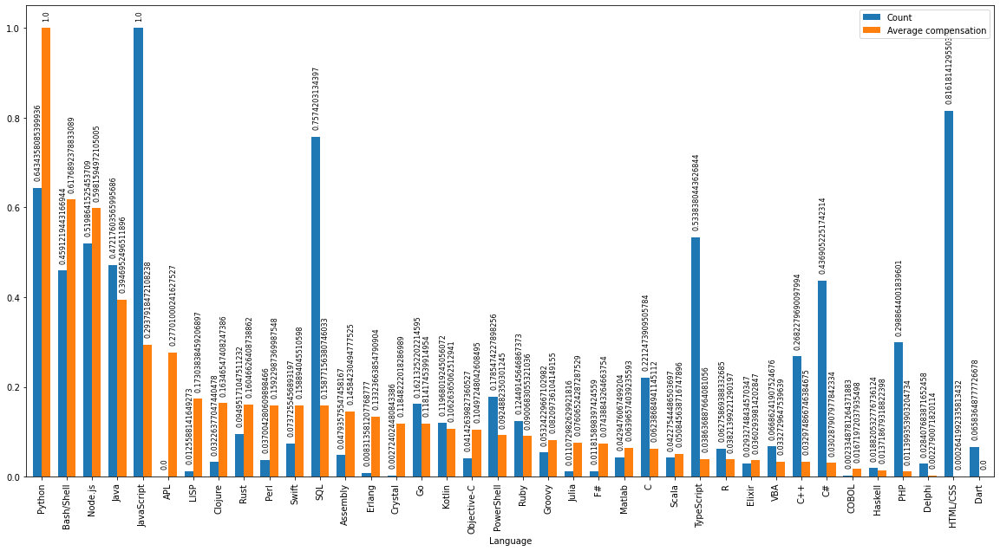

In [6]:
# Figure creation
fig1, ax1 = plt.subplots()

# Organizing by average compensation
language_df.sort_values(by=['Average compensation'], inplace=True, ascending=False)

# Plotting a grouped bar chart
language_df.plot(x='Language', y=['Count','Average compensation'], kind='bar', width=q1_width, figsize=q1_figsize, ax=ax1)

for p in ax1.patches:
    an = ax1.annotate(str(p.get_height()), xy=(p.get_x()+0.06, p.get_height()+0.02))
    an.set_size(8)
    an.set_rotation(90)

'\nfor p in ax_languages.patches:\n    an = ax_languages.annotate(str(p.get_height()), xy=(p.get_x()+0.1, p.get_height()+0.02))\n    an.set_size(8)\n    an.set_rotation(90)\n'

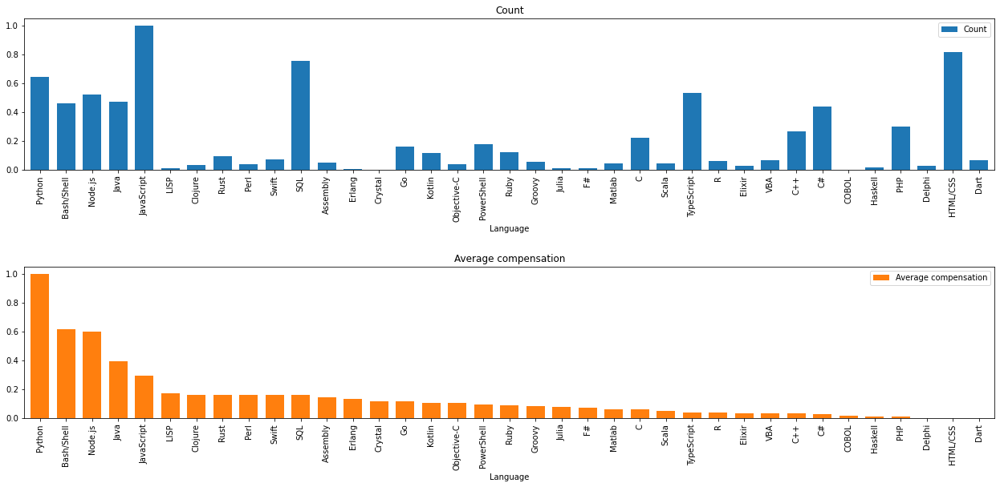

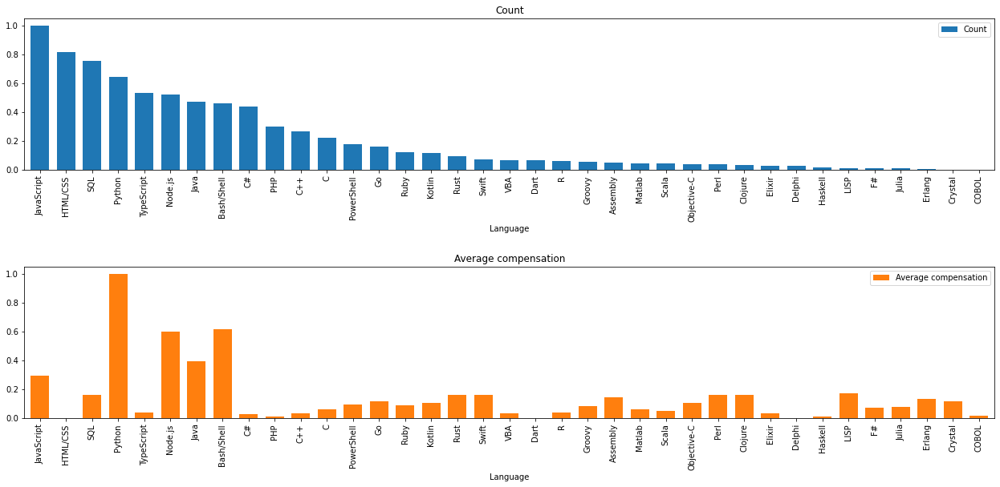

In [7]:
# Figure creation
fig_languages, ax_languages = plt.subplots(2, 1, figsize=q1_figsize)
fig_languages.tight_layout(pad=q1_padding)

fig_languages2, ax_languages2 = plt.subplots(2, 1, figsize=q1_figsize)
fig_languages2.tight_layout(pad=q1_padding)

# Dropping APL language as it has a gigantic value in comparison with others
language_df2 = language_df.drop(language_df[language_df['Language'] == "APL"].index)

# Plotting in order by best compensated language
language_df2.plot(x='Language', y=['Count','Average compensation'], kind='bar', width=q1_width, figsize=q1_figsize, ax=ax_languages, subplots=True)

# Copying last dataframe to plot in order by most people using a language
language_df3 = language_df2
language_df3.sort_values(by=['Count'], inplace=True, ascending=False)
language_df3.plot(x='Language', y=['Count','Average compensation'], kind='bar', width=q1_width, figsize=q1_figsize, ax=ax_languages2, subplots=True)


# For putting annotations on the bar charts
'''
for p in ax_languages.patches:
    an = ax_languages.annotate(str(p.get_height()), xy=(p.get_x()+0.1, p.get_height()+0.02))
    an.set_size(8)
    an.set_rotation(90)
'''

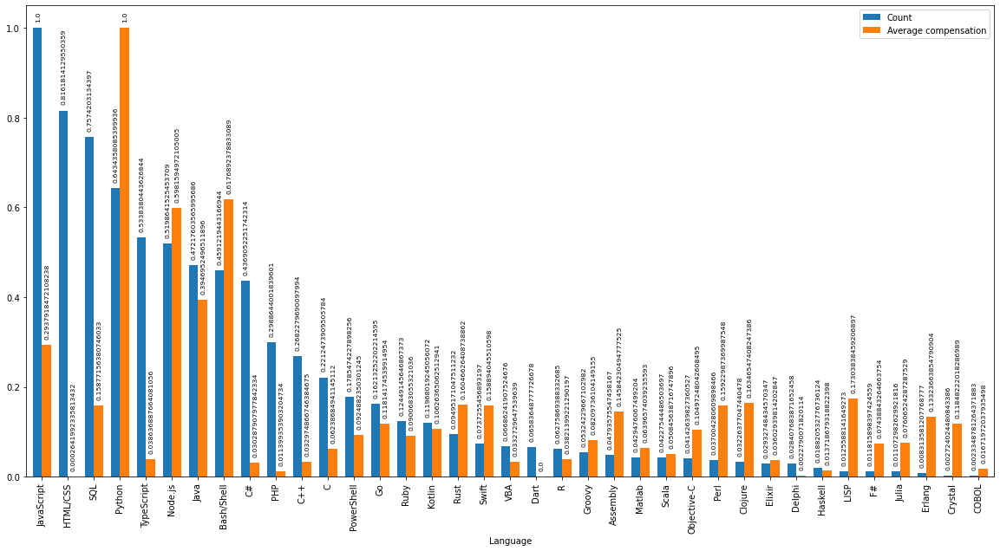

In [11]:
# Figure creation
fig_languages3, ax_languages3 = plt.subplots()

# Plotting a grouped bars chart with count of people using it and average compensation
language_df2.plot(x='Language', y=['Count','Average compensation'], kind='bar', ax = ax_languages3, width=q1_width, figsize=q1_figsize)

for p in ax_languages3.patches:
    an = ax_languages3.annotate(str(p.get_height()), xy=(p.get_x()+0.1, p.get_height()+0.015))
    an.set_size(7.8)
    an.set_rotation(90)

### Question 2

#### From years of coding, years of pro coding or education level, which generates the highest salary? How does coding years either pro or rookie level correlates to salary?

To analyze this question a correlation was performed with the columns needed

In [12]:
# Functions needed

# Create dummy columns for the. categorical columns in order to get the correlation
def create_dummy_df(df, cat_cols, dummy_na):
    '''
    INPUT:
    df - pandas dataframe with categorical variables you want to dummy
    cat_cols - list of strings that are associated with names of the categorical columns
    dummy_na - Bool holding whether you want to dummy NA vals of categorical columns or not
    
    OUTPUT:
    df - a new dataframe that has the following characteristics:
            1. contains all columns that were not specified as categorical
            2. removes all the original columns in cat_cols
            3. dummy columns for each of the categorical columns in cat_cols
            4. if dummy_na is True - it also contains dummy columns for the NaN values
            5. Use a prefix of the column name with an underscore (_) for separating 
    '''
    for col in  cat_cols:
        try:
            # for each cat add dummy var, drop original column
            df = pd.concat([df.drop(col, axis=1), pd.get_dummies(df[col], prefix=col, prefix_sep='_', drop_first=True, dummy_na=dummy_na)], axis=1)
        except:
            continue
    return df


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



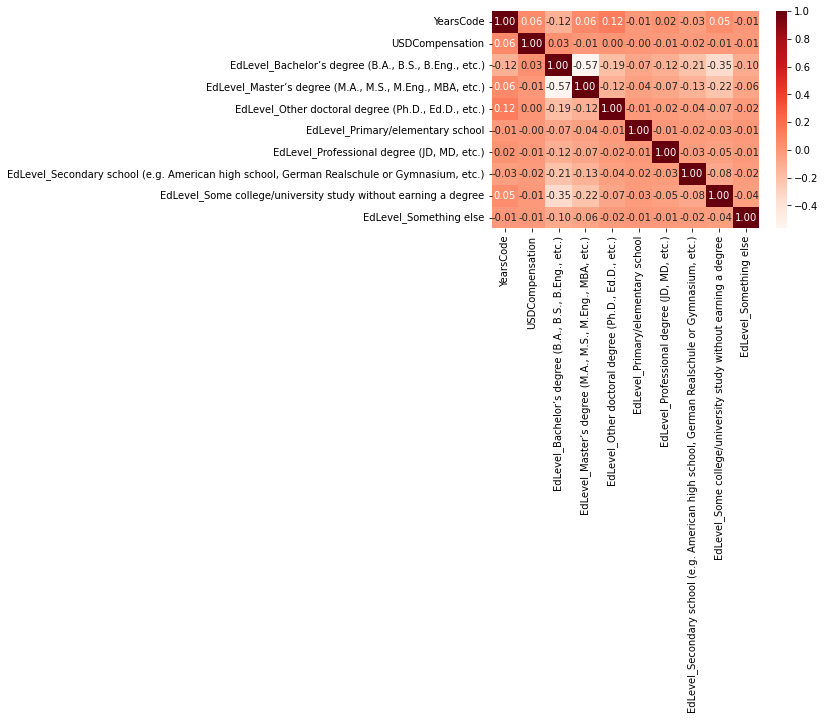

In [27]:
# Generate new dataframe
q2_df = survey_2021[['EdLevel','YearsCode','YearsCodePro','USDCompensation']]

# Data cleaning
q2_df.dropna(subset=['EdLevel','YearsCode','YearsCodePro'], inplace=True)

q2_df.replace('Less than 1 year', 0, inplace=True)
q2_df.replace('More than 50 years', 51, inplace=True)

# Create df with dummy columns for the Education Level to be analyzed with the correlation function
q2_df2 = create_dummy_df(q2_df, ['EdLevel'], False)

# Change column type as YearsCode and YearsCodePro are object type
q2_df2['YearsCode'] = q2_df2['YearsCode'].astype('int64')
#q2_df2['YearsCodePro'] = q2_df2['YearsCodePro'].astype('int64')
q2_df2['USDCompensation'] = q2_df['USDCompensation']#.astype('int32')

#MonthlyCompensation
q2_df2.head()

sns.heatmap(q2_df2.corr(), annot=True, fmt=".2f", cmap="Reds");

### Question 3

#### Which way to learn gives the biggest salary? In which type of companies each of these ways to learn people work?

To answer this question two new dataframe were obatained: 

1. Dataframe with the average salary of the different ways to learn 
2. Dataframe with the count of the types of companies in which the people work in depending on the way in which they learnt

In [28]:
def normalization_learning2(value, column_mean, column_min, column_max):
    
    if(value == column_max):
        return 1
    
    elif(value == column_min):
        return -1
    
    elif(value > column_mean):
        diff = column_max - column_mean
        val_diff = column_max - value
        result = val_diff / diff
        
        if(result > 0):
            return 1 - result
        elif(result < 0):
            return -1 - result
        
    elif(value < column_mean):
        diff = column_mean - column_min
        val_diff = column_min - value
        result = val_diff / diff
        
        if(result > 0):
            return 1 - result
        elif(result < 0):
            return -1 - result
    
    else:
        return 0

In [16]:
survey_2021.apply(lambda row: get_average_df(globaldf, row['LearnCode'],row['USDCompensation'],
                                                 'Way to Learn','Average compensation'), axis=1)

# Assignation of the global df to the dataframe that will be used to make our analysis
learning_df = globaldf

# Get a copy of the df to analyze the actual values
learning_df_nn = learning_df

# Reset globaldf
flag = 0

In [29]:
# Normalization considering 0 as the mean, -1 as the minimun and 1 as the maximum

# Get the averages, minimums and maximums
count_mean = learning_df['Count'].mean()
count_min = learning_df['Count'].min()
count_max = learning_df['Count'].max()

avg_mean = learning_df['Average compensation'].mean()
avg_min = learning_df['Average compensation'].min()
avg_max = learning_df['Average compensation'].max()

# Normalize the average compensation
learning_df['Average compensation'] = learning_df['Average compensation'].apply(
    normalization_learning2, args=(avg_mean, avg_min, avg_max))

# Normalize the count
learning_df['Count'] = learning_df['Count'].apply(
    normalization_learning2, args=(count_mean, count_min, count_max))

In [30]:
display(learning_df)
display(learning_df_nn)
#survey_2021.head(2)

,Way to Learn,Count,Average compensation
0,Coding Bootcamp,-1.000000,-0.952920
1,"Other online resources (ex: videos, blogs, etc)",0.923271,0.242791
2,School,1.000000,-0.901471
3,Friend or family member,-0.588956,1.000000
4,Other (please specify):,-0.998175,-0.956490
5,Online Courses or Certification,0.200287,0.405851
6,Online Forum,-0.055835,0.228368
7,Colleague,-0.572226,-1.000000
8,Books / Physical media,0.918310,0.276745


,Way to Learn,Count,Average compensation
0,Coding Bootcamp,-1.000000,-0.952920
1,"Other online resources (ex: videos, blogs, etc)",0.923271,0.242791
2,School,1.000000,-0.901471
3,Friend or family member,-0.588956,1.000000
4,Other (please specify):,-0.998175,-0.956490
5,Online Courses or Certification,0.200287,0.405851
6,Online Forum,-0.055835,0.228368
7,Colleague,-0.572226,-1.000000
8,Books / Physical media,0.918310,0.276745


'\nfor p in ax_languages4.patches:\n    an = ax_languages4.annotate(str(p.get_height()), xy=(p.get_x()+0.1, p.get_height()+0.015))\n    an.set_size(7.8)\n    an.set_rotation(90)\n'

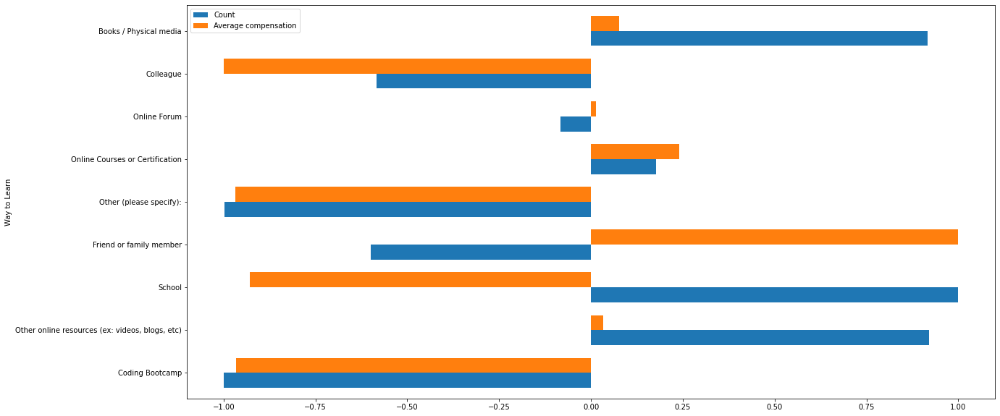

In [20]:
# Figure creation
fig_languages4, ax_languages4 = plt.subplots()

# Plotting a grouped bars chart with count of people using it and average compensation
learning_df.plot(x='Way to Learn', y=['Count','Average compensation'], kind='barh', ax = ax_languages4, width=q1_width, figsize=q1_figsize)

'''
for p in ax_languages4.patches:
    an = ax_languages4.annotate(str(p.get_height()), xy=(p.get_x()+0.1, p.get_height()+0.015))
    an.set_size(7.8)
    an.set_rotation(90)
'''

In [31]:
survey_2021['LearnCode'].value_counts(dropna=False)
string = survey_2021['LearnCode'][0]
print(string)
testdf = survey_2021.head(20)
flag = 0

#survey_2021['CompTotal'].mean()
#flag = 1

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=10.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [32]:
q2_df2['USDCompensation'].sort_values(ascending=False)

3733     900000.000000
33255    900000.000000
35779    880000.000000
9189     850000.000000
7904     840000.000000
10372    828000.000000
64111    800000.000000
53028    800000.000000
52070    800000.000000
20908    800000.000000
66323    800000.000000
7134     760000.000000
60701    760000.000000
66417    728000.000000
64281    720000.000000
51240    708000.000000
33313    698726.104767
47536    680000.000000
51010    660000.000000
47210    648000.000000
25102    644249.587969
77060    640000.000000
55534    640000.000000
33919    640000.000000
66013    640000.000000
4395     632000.000000
54701    632000.000000
78554    607484.231635
77655    600000.000000
46391    600000.000000
1931     600000.000000
5000     600000.000000
59563    600000.000000
45288    591500.177326
36552    590600.000000
27561    580000.000000
52251    560000.000000
30569    560000.000000
64283    560000.000000
50225    560000.000000
26266    540000.000000
27038    540000.000000
59458    540000.000000
76830    52

In [24]:
survey_2021['EdLevel'].value_counts(dropna=False)

Bachelor’s degree (B.A., B.S., B.Eng., etc.)                                          20173
Master’s degree (M.A., M.S., M.Eng., MBA, etc.)                                       11137
Some college/university study without earning a degree                                 5097
Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)     1896
Other doctoral degree (Ph.D., Ed.D., etc.)                                             1648
Associate degree (A.A., A.S., etc.)                                                    1266
Professional degree (JD, MD, etc.)                                                      638
Something else                                                                          450
Primary/elementary school                                                               225
NaN                                                                                      18
Name: EdLevel, dtype: int64

In [38]:
ed_level_count_gen = survey_2021.groupby('EdLevel')['CompTotal'].agg(['count']).reset_index()
ed_level_avg_gen = survey_2021.groupby('EdLevel')['USDCompensation'].agg(['mean']).reset_index()

ed_level_count = survey_2021.groupby(['EdLevel','OrgSize'])['CompTotal'].agg(['count']).reset_index()
ed_level_avg = survey_2021.groupby(['EdLevel','OrgSize'])['CompTotal'].agg(['mean']).reset_index()

ed_level_df_gen = pd.concat([ed_level_count_gen, ed_level_avg_gen['mean']], axis=1)
ed_level_df = pd.concat([ed_level_count, ed_level_avg['mean']], axis=1)

#ed_level_df['perc'] = ed_level_df.apply(lambda row: row['count'] / ed_level_df_gen[ed_level_df_gen['EdLevel'] == row['EdLevel']]['count'][0],
     #                                   axis=1)

#ed_level_df['perc'] = ed_level_df['count'] / ed_level_df_gen[ed_level_df_gen['EdLevel'] == ed_level_df['EdLevel']]['count'][0]

#ed_level_df['count'] / ed_level_df_gen[ed_level_df_gen['EdLevel'] == ed_level_df['EdLevel']]['count'][0]

# Normalization of values
#ed_level_df_gen[['count', 'mean']] = ed_level_df_gen[['count', 'mean']].apply(
    #lambda column: (column - column.min()) / (column.max() - column.min()))

display(ed_level_df_gen)
display(ed_level_df)


,EdLevel,count,mean
0,"Associate degree (A.A., A.S., etc.)",1266,9490.284439
1,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",20173,10859.890690
2,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",11137,9413.959930
3,"Other doctoral degree (Ph.D., Ed.D., etc.)",1648,10494.286758
4,Primary/elementary school,225,8386.503510
5,"Professional degree (JD, MD, etc.)",638,6238.819458
6,"Secondary school (e.g. American high school, G...",1896,6577.909904
7,Some college/university study without earning ...,5097,8797.188809
8,Something else,450,6269.269421


,EdLevel,OrgSize,count,mean
0,"Associate degree (A.A., A.S., etc.)","1,000 to 4,999 employees",122,2.343175e+05
1,"Associate degree (A.A., A.S., etc.)",10 to 19 employees,140,1.856304e+05
2,"Associate degree (A.A., A.S., etc.)","10,000 or more employees",138,3.544329e+05
3,"Associate degree (A.A., A.S., etc.)",100 to 499 employees,241,2.423165e+05
4,"Associate degree (A.A., A.S., etc.)",2 to 9 employees,126,1.376678e+05
5,"Associate degree (A.A., A.S., etc.)",20 to 99 employees,300,7.294303e+05
6,"Associate degree (A.A., A.S., etc.)","5,000 to 9,999 employees",37,1.115577e+05
7,"Associate degree (A.A., A.S., etc.)",500 to 999 employees,94,3.873979e+05
8,"Associate degree (A.A., A.S., etc.)",I don’t know,21,7.739048e+04
9,"Associate degree (A.A., A.S., etc.)","Just me - I am a freelancer, sole proprietor, ...",46,1.364902e+05


In [45]:
#org_df.drop(['level_0','index'], axis=1, inplace=True)
#org_df.drop(org_df.index, inplace=True)

for column in ed_level_df['EdLevel'].unique():
    
    new_row = ed_level_df[ed_level_df['EdLevel'] == column]
    new_row = new_row[['OrgSize','count']]
    
    new_row = new_row.transpose()
    
    new_header = new_row.iloc[0] #grab the first row for the header
    new_row = new_row[1:] #take the data less the header row
    new_row.columns = new_header #set the header row as the df header
    
    org_df = pd.concat([org_df, new_row])

org_df.reset_index(inplace=True)

# Dataframes concatenation
ed_level_orgsize = pd.concat([ed_level_df_gen,org_df], axis=1)
display(ed_level_orgsize)

# Change object to int type
ed_level_orgsize.iloc[:, 4:12] = ed_level_orgsize.iloc[:, 4:12].astype('int64')

# Eliminates index column from reset_index method
org_df = org_df.iloc[: , 2:]


,EdLevel,count,mean,index,10 to 19 employees,"10,000 or more employees",100 to 499 employees,2 to 9 employees,20 to 99 employees,"5,000 to 9,999 employees",500 to 999 employees,I don’t know,"Just me - I am a freelancer, sole proprietor, etc.","1,000 to 4,999 employees"
0,"Associate degree (A.A., A.S., etc.)",1266.0,9490.284439,0,140,138,241,126,300,37,94,21,46,NaN
1,"Bachelor’s degree (B.A., B.S., B.Eng., etc.)",20173.0,10859.890690,1,1625,3150,3818,1760,4143,854,1381,328,799,NaN
2,"Master’s degree (M.A., M.S., M.Eng., MBA, etc.)",11137.0,9413.959930,2,923,1698,1993,913,2294,493,765,173,514,NaN
3,"Other doctoral degree (Ph.D., Ed.D., etc.)",1648.0,10494.286758,3,91,285,259,115,257,117,110,56,70,NaN
4,Primary/elementary school,225.0,8386.503510,4,25,12,31,36,48,5,9,5,38,NaN
5,"Professional degree (JD, MD, etc.)",638.0,6238.819458,5,67,63,93,93,142,23,37,13,52,NaN
6,"Secondary school (e.g. American high school, G...",1896.0,6577.909904,6,231,133,293,302,441,54,88,35,178,NaN
7,Some college/university study without earning ...,5097.0,8797.188809,7,501,462,907,690,1173,153,291,59,381,NaN
8,Something else,450.0,6269.269421,8,41,33,74,79,114,11,19,11,28,NaN
9,NaN,NaN,NaN,9,140,138,241,126,300,37,94,21,46,NaN


NameError: name 'ed_level_orgsize' is not defined

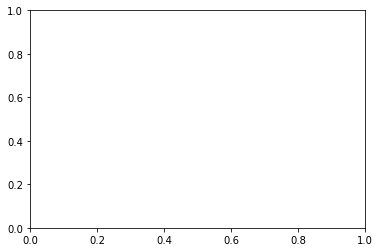

In [26]:
# Figure creation
fig_4, ax_4 = plt.subplots()

columns_plot = ['2 to 9 employees','20 to 99 employees','5,000 to 9,999 employees','500 to 999 employees',
               'I don’t know','Just me - I am a freelancer, sole proprietor, etc.','1,000 to 4,999 employees',
               '10 to 19 employees','10,000 or more employees']

# Plotting a grouped bars chart with count of people using it and average compensation
ed_level_orgsize.plot(x='EdLevel', y=columns_plot, kind='bar', ax = ax_4, width=q1_width, 
                  figsize=q1_figsize, stacked=True)

# Figure creation
fig_5, ax_5 = plt.subplots()

# Plotting a grouped bars chart with count of people using it and average compensation
ed_level_df.plot(x='EdLevel', y=['count'], kind='bar', ax = ax_languages4, width=q1_width, 
                  figsize=q1_figsize, stacked=True)

In [307]:
print(ed_level_df['EdLevel'].unique())

ed_level_orgsize.dtypes

# ed_level_orgsize.loc[ed_level_orgsize['EdLevel'] == 'Associate degree (A.A., A.S., etc.', 'count'].iloc[0]

ed_level_df_gen[ed_level_df_gen['EdLevel'] == 'Associate degree (A.A., A.S., etc.)']['count'][0]

['Associate degree (A.A., A.S., etc.)'
 'Bachelor’s degree (B.A., B.S., B.Eng., etc.)'
 'Master’s degree (M.A., M.S., M.Eng., MBA, etc.)'
 'Other doctoral degree (Ph.D., Ed.D., etc.)' 'Primary/elementary school'
 'Professional degree (JD, MD, etc.)'
 'Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)'
 'Some college/university study without earning a degree' 'Something else']


1266

In [238]:
df = q2_df2[q2_df2['USDCompensation'] > 10000]
df.sort_values(by=['USDCompensation'], ascending=False)
#survey_2021.iloc[[6377]]

,YearsCode,YearsCodePro,USDCompensation,"EdLevel_Bachelor’s degree (B.A., B.S., B.Eng., etc.)","EdLevel_Master’s degree (M.A., M.S., M.Eng., MBA, etc.)","EdLevel_Other doctoral degree (Ph.D., Ed.D., etc.)",EdLevel_Primary/elementary school,"EdLevel_Professional degree (JD, MD, etc.)","EdLevel_Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)",EdLevel_Some college/university study without earning a degree,EdLevel_Something else
18919,3,0,4.007684e+51,1,0,0,0,0,0,0,0
45850,7,7,2.672124e+16,0,0,0,0,0,0,0,1
37018,8,5,4.002800e+10,1,0,0,0,0,0,0,0
39571,10,18,1.021192e+09,0,0,0,0,0,0,1,0
62851,25,23,2.543200e+07,0,0,1,0,0,0,0,0
40586,37,13,1.745780e+06,0,0,0,0,0,0,1,0
28791,11,9,1.666667e+06,1,0,0,0,0,0,0,0
12700,5,5,1.600000e+06,0,1,0,0,0,0,0,0
51508,10,10,1.500000e+06,0,1,0,0,0,0,0,0
9608,25,21,1.400000e+06,1,0,0,0,0,0,0,0


In [223]:
survey_2021.head(50)
#survey_2021['USDCompensation'].max()
q2_df2.dtypes

YearsCode                                                                                       int32
YearsCodePro                                                                                    int32
USDCompensation                                                                               float64
EdLevel_Bachelor’s degree (B.A., B.S., B.Eng., etc.)                                            uint8
EdLevel_Master’s degree (M.A., M.S., M.Eng., MBA, etc.)                                         uint8
EdLevel_Other doctoral degree (Ph.D., Ed.D., etc.)                                              uint8
EdLevel_Primary/elementary school                                                               uint8
EdLevel_Professional degree (JD, MD, etc.)                                                      uint8
EdLevel_Secondary school (e.g. American high school, German Realschule or Gymnasium, etc.)      uint8
EdLevel_Some college/university study without earning a degree                    